In [2]:
import pandas as pd

sector_df = pd.read_csv('broad_china_sector_return_wide_20241221.csv')
sector_df['date'] = pd.to_datetime(sector_df['date'])
sector_df.set_index(['date'], inplace=True)

Correlation

In [ ]:
import seaborn as sns
sns.pairplot(sector_df)

<Axes: >

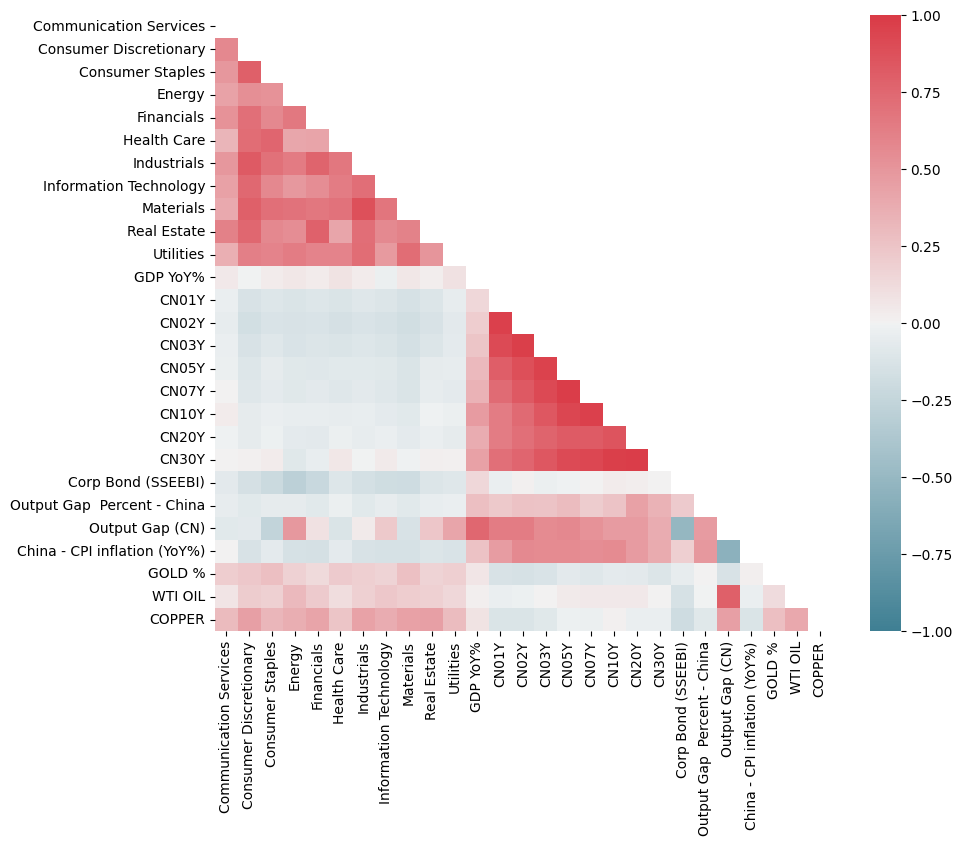

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np 

f, ax = plt.subplots(figsize=(10, 8))
corr = sector_df.drop(columns={'year', 'month'}).corr()

mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan

sns.heatmap(corr,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1.0, vmax=1.0,
    square=True, ax=ax)

In [23]:
rolling_corr.tail()

,date,level_1,Communication Services,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,...,GDP YoY%,CN01Y,CN05Y,CN30Y,Corp Bond (SSEEBI),Output Gap Percent - China,China - CPI inflation (YoY%),GOLD %,WTI OIL,COPPER
6043,2024-11-15,Output Gap Percent - China,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6044,2024-11-15,China - CPI inflation (YoY%),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6045,2024-11-15,GOLD %,0.220731,0.282339,0.203059,-0.205480,0.105688,0.137004,0.240684,0.222861,...,0.071886,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,-0.079833,0.339036
6046,2024-11-15,WTI OIL,-0.148674,-0.407642,-0.389298,0.263493,-0.418947,-0.415380,-0.337869,-0.173466,...,0.258866,NaN,NaN,NaN,NaN,NaN,NaN,-0.079833,1.000000,-0.164570
6047,2024-11-15,COPPER,0.529954,0.438410,0.395664,0.344388,0.459310,0.279601,0.394134,0.117612,...,0.488974,NaN,NaN,NaN,NaN,NaN,NaN,0.339036,-0.164570,1.000000


Rolling correlations

In [4]:
plots = ['GDP YoY%', 'CN01Y', 'CN05Y',
       'CN30Y', 'Corp Bond (SSEEBI)',
       'Output Gap  Percent - China', 
       'China - CPI inflation (YoY%)', 'Communication Services', 'Consumer Discretionary',
       'Consumer Staples', 'Energy', 'Financials', 'Health Care',
       'Industrials', 'Information Technology', 'Materials', 'Real Estate',
       'Utilities','GOLD %', 'WTI OIL', 'COPPER']

tt = sector_df.drop(columns=['year','month', 'CN02Y', 'CN03Y',  'CN07Y', 'CN10Y', 'CN20Y', 'Output Gap (CN)'])
rolling_corr = tt.rolling(12).corr()
rolling_corr.reset_index(inplace=True)

import plotly.express as px
import plotly.io as pio
pio.renderers.default='notebook'

for p in plots:
    fig = px.line(rolling_corr, x='date', y=p, color='level_1', title=f'vs {p}')
    fig.show()


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

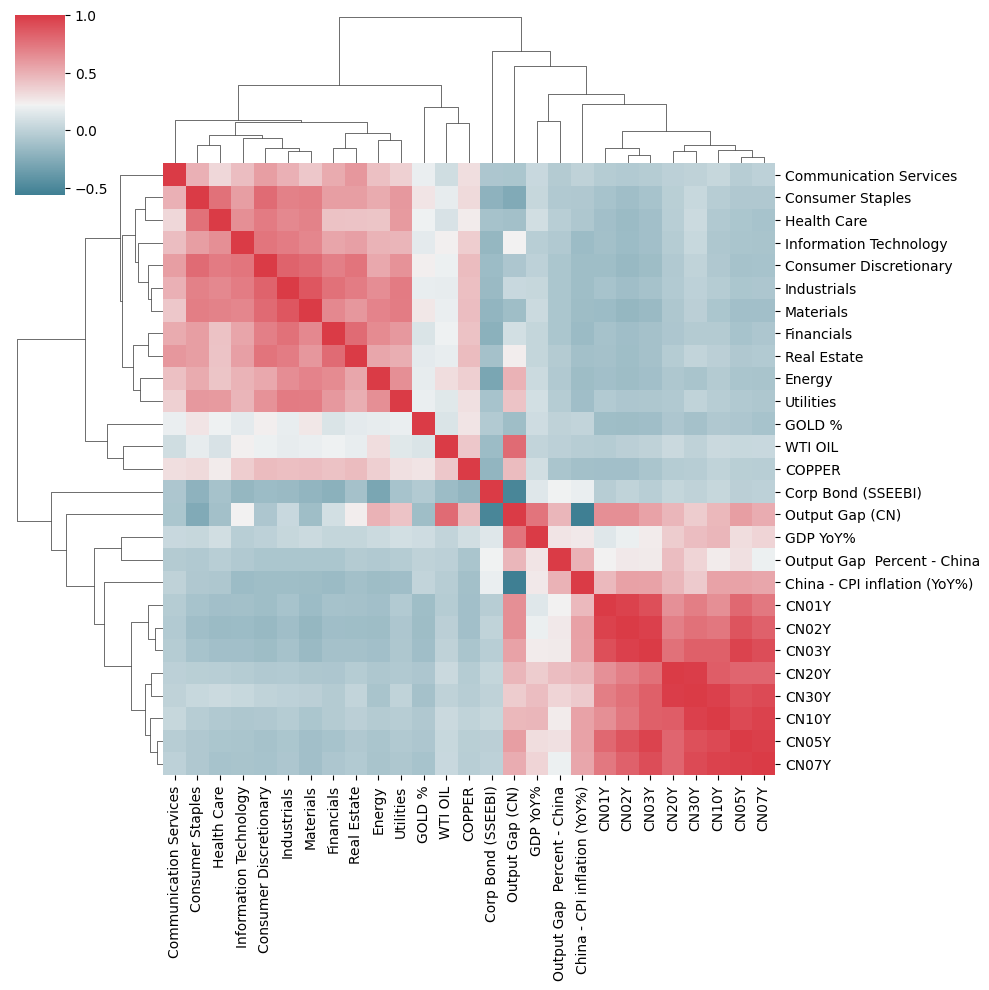

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

corr = sector_df.drop(columns={'year','month'}).corr()

# mask = np.zeros_like(corr, dtype=bool)
# mask[np.triu_indices_from(mask)] = True

g = sns.clustermap(corr, 
                #    mask = mask,
                   method = 'complete', 
                   cmap   = sns.diverging_palette(220, 10, as_cmap=True), 
                   annot  = False, 
                   annot_kws = {'size': 8})
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90)

In [5]:
columns_to_cumprod = ['Communication Services', 'Consumer Discretionary',
       'Consumer Staples', 'Energy', 'Financials', 'Health Care',
       'Industrials', 'Information Technology', 'Materials', 'Real Estate',
       'Utilities', 'GOLD %', 'WTI OIL', 'COPPER']

index_df = sector_df[columns_to_cumprod].apply(lambda x: (1 + x).cumprod())

fig = px.line(index_df, x=index_df.index, y=columns_to_cumprod, title=f'Sector cumulative returns')
fig.show()

# fig = plt.subplots(figsize=(20, 5))
# sns.lineplot(index_df)
# plt.title('Sector cumulative returns')

OECD

In [6]:
oecd = pd.read_csv('oecd.csv')
defn = oecd[['name','description']].drop_duplicates()
oecd['date'] = pd.to_datetime(oecd['date'])

C:\Users\vichua\AppData\Local\Temp\ipykernel_27320\85485739.py:3: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



<Axes: xlabel='date', ylabel='value'>

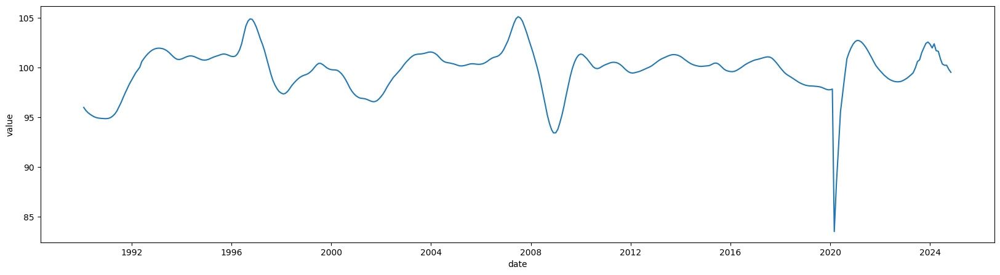

In [7]:
to_plot = oecd[oecd['name'] == 'OECD_CH']
fig = plt.subplots(figsize=(20, 5))
sns.lineplot(to_plot, x = 'date', y = 'value')

<Axes: xlabel='date', ylabel='value'>

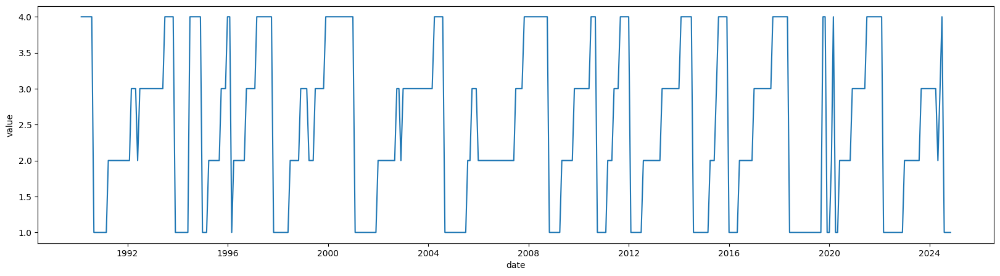

In [8]:
cycle = oecd[oecd['name'] == 'OECD_CHN_REGIME_V2']
fig = plt.subplots(figsize=(20, 5))
sns.lineplot(cycle, x = 'date', y = 'value')

In [ ]:
cycle_map = {1: 'Recovery', 2: 'Expansion', 3: 'Slowdown', 4:'Downturn'}
cycle['value_name'] = [cycle_map[m] for m in cycle['value']]

In [ ]:
cycle["cycle_change"] = cycle['value'] != cycle['value'].shift()

# Use `cumsum` to create a unique group for each continuous cycle segment
cycle["cycle_group"] = cycle["cycle_change"].cumsum()

# Group by cycle and cycle_group, then find the min and max dates for each group
cycle_periods = cycle.groupby(['value_name', "cycle_group"]).agg(
    start_date=("date", "min"),
    end_date=("date", "max"),
    cycle=('value_name', "first")
).reset_index(drop=True)

Cycle occurrance count

In [28]:
cycle_periods['duration'] = cycle_periods['end_date'] - cycle_periods['start_date']
cycle_periods[cycle_periods['duration'] > pd.Timedelta(0, 'days')].groupby('cycle')['start_date'].count()

cycle
Downturn     15
Expansion    15
Recovery     16
Slowdown     16
Name: start_date, dtype: int64

Cycle periods

In [29]:
cycle_periods.loc[(cycle_periods['duration'] > pd.Timedelta(0, 'days')) & (cycle_periods['cycle'] == 'Downturn')]

,start_date,end_date,cycle,duration
0,1990-02-28,1990-07-31,Downturn,153 days
1,1993-06-30,1993-10-29,Downturn,121 days
2,1994-06-30,1994-11-30,Downturn,153 days
3,1995-12-29,1996-01-31,Downturn,33 days
4,1997-02-28,1997-09-30,Downturn,214 days
5,1999-11-30,2000-12-29,Downturn,395 days
6,2004-03-31,2004-07-30,Downturn,121 days
7,2007-10-31,2008-09-30,Downturn,335 days
8,2010-06-30,2010-08-31,Downturn,62 days
9,2011-08-31,2011-12-30,Downturn,121 days


In [123]:
cycle_periods.loc[(cycle_periods['duration'] > pd.Timedelta(0, 'days')) & (cycle_periods['cycle'] == 'Slowdown')]

,start_date,end_date,cycle,duration
53,1992-02-28,1992-04-30,Slowdown,62 days
54,1992-06-30,1993-05-31,Slowdown,335 days
55,1995-09-29,1995-11-30,Slowdown,62 days
56,1996-09-30,1997-01-31,Slowdown,123 days
57,1998-11-30,1999-02-26,Slowdown,88 days
58,1999-06-30,1999-10-29,Slowdown,121 days
59,2002-09-30,2002-10-31,Slowdown,31 days
60,2002-12-31,2004-02-27,Slowdown,423 days
61,2005-09-30,2005-11-30,Slowdown,61 days
62,2007-06-29,2007-09-28,Slowdown,91 days


In [124]:
cycle_periods.loc[(cycle_periods['duration'] > pd.Timedelta(0, 'days')) & (cycle_periods['cycle'] == 'Expansion')]

,start_date,end_date,cycle,duration
17,1991-03-29,1992-01-31,Expansion,308 days
19,1995-03-31,1995-08-31,Expansion,153 days
20,1996-03-29,1996-08-30,Expansion,154 days
21,1998-06-30,1998-10-30,Expansion,122 days
22,1999-03-31,1999-05-31,Expansion,61 days
23,2001-12-31,2002-08-30,Expansion,242 days
25,2005-07-29,2005-08-31,Expansion,33 days
26,2005-12-30,2007-05-31,Expansion,517 days
27,2009-04-30,2009-09-30,Expansion,153 days
28,2011-02-28,2011-04-29,Expansion,60 days


In [125]:
cycle_periods.loc[(cycle_periods['duration'] > pd.Timedelta(0, 'days')) & (cycle_periods['cycle'] == 'Recovery')]

,start_date,end_date,cycle,duration
36,1990-08-31,1991-02-28,Recovery,181 days
37,1993-11-30,1994-05-31,Recovery,182 days
38,1994-12-30,1995-02-28,Recovery,60 days
40,1997-10-31,1998-05-29,Recovery,210 days
41,2001-01-31,2001-11-30,Recovery,303 days
42,2004-08-31,2005-06-30,Recovery,303 days
43,2008-10-31,2009-03-31,Recovery,151 days
44,2010-09-30,2011-01-31,Recovery,123 days
45,2012-01-31,2012-06-29,Recovery,150 days
46,2014-07-31,2015-02-27,Recovery,211 days


Returns by Cycle

In [20]:
universe_df = pd.read_csv('broad_china_universe_return.csv')
universe_df['date'] = pd.to_datetime(universe_df['date'])

In [21]:
import plotly.graph_objects as go

universe_df['cum_ret'] = (1 + universe_df['FWD_RET_1M']).cumprod()

columns_to_cumprod = ['Communication Services', 'Consumer Discretionary',
       'Consumer Staples', 'Energy', 'Financials', 'Health Care',
       'Industrials', 'Information Technology', 'Materials', 'Real Estate',
       'Utilities', 'GOLD %', 'WTI OIL', 'COPPER']

index_df = sector_df[columns_to_cumprod].apply(lambda x: (1 + x).cumprod())

# Define colors for each cycle type
cycle_colors = {
    "Slowdown": px.colors.qualitative.Pastel[1],
    "Recovery": px.colors.qualitative.Pastel[0],
    "Expansion": px.colors.qualitative.Pastel[2],
    "Downturn": px.colors.qualitative.Pastel[3]
}

# Create the Plotly figure
fig = go.Figure()

# Add sector lines
for c in columns_to_cumprod:
    fig.add_trace(go.Scatter(x=index_df.index, y=index_df[c], name=f'{c}', mode='lines'))

# Add Broad China line
fig.add_trace(go.Scatter(x=universe_df["date"], y=universe_df["cum_ret"], name='Broad China', mode='lines', line=dict(color='black')))

# Add shaded background colors for each cycle period
for _, cycle in cycle_periods.iterrows():
    cycle_name = cycle['cycle']
    color = cycle_colors.get(cycle_name, "gray")
    fig.add_vrect(x0=cycle["start_date"].strftime("%Y-%m-%d"), 
              x1=(cycle["end_date"] + pd.DateOffset(months=1)).strftime("%Y-%m-%d"), 
              fillcolor=color, opacity=0.2, line_width=0, name=cycle_name)

# Create a separate legend for cycle_periods
cycle_legend = [
    go.Scatter(
        x=[None], 
        y=[None], 
        mode='markers',
        marker=dict(color=color),
        name=cycle_name,
        showlegend=True
    ) 
    for cycle_name, color in cycle_colors.items()
]

# Add cycle_periods legend traces to the figure
fig.add_traces(cycle_legend)

# Customize the layout
fig.update_layout(
    title=f"Broad China Cumulative Return",
    xaxis_title="Date",
    yaxis_title='Broad China',
    legend=dict(
        x=1.2,
        y=1,
        xanchor='right',
        yanchor='top'
    ),
    xaxis_range=[universe_df["date"].min(), universe_df["date"].max()]
)

# Show the plot
fig.show()

In [14]:
cycle_df = oecd[oecd['name'] == 'OECD_CHN_REGIME_V2'][['date','value']]
cycle_df['cycle'] = [cycle_map[m] for m in cycle_df['value']]
cycle_df.set_index('date', inplace=True)
cycle_df[['cycle']].head()
universe_df.set_index('date', inplace=True)

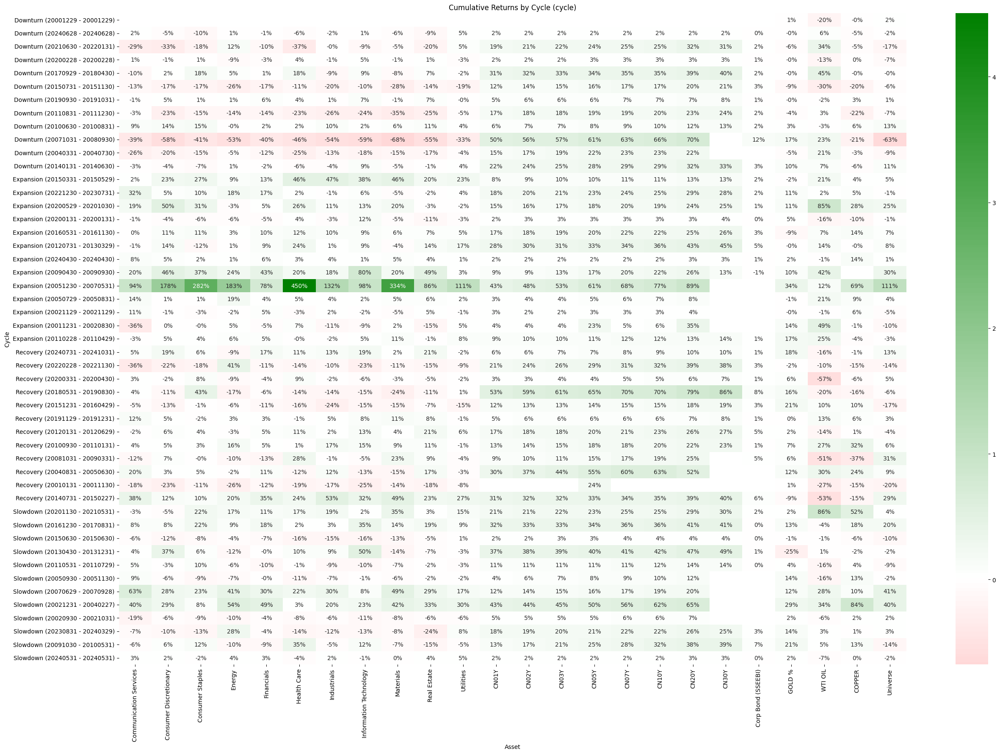

In [15]:
data = sector_df.join(universe_df).join(cycle_df)
data.rename(columns={'FWD_RET_1M':'Universe'}, inplace=True)
data.reset_index(inplace=True)

columns_to_cumprod = ['Communication Services', 'Consumer Discretionary',
       'Consumer Staples', 'Energy', 'Financials', 'Health Care',
       'Industrials', 'Information Technology', 'Materials', 'Real Estate',
       'Utilities', 'CN01Y', 'CN02Y', 'CN03Y', 'CN05Y', 'CN07Y',
       'CN10Y', 'CN20Y', 'CN30Y', 'Corp Bond (SSEEBI)', 'GOLD %', 'WTI OIL', 'COPPER','Universe']

source = 'cycle'

# Compute start and end dates for each cycle
# Identify cycle changes by comparing with the previous row
data["cycle_change"] = data[source] != data[source].shift()
# Use `cumsum` to create a unique group for each continuous cycle segment
data["cycle_group"] = data["cycle_change"].cumsum()
cycle_dates = data.groupby([source, "cycle_group"]).agg(start_date=("date", "min"), end_date=("date", "max")).reset_index()

# Compute cumulative product for each column in each cycle and get the last value in each group
cumprod_results = data.groupby([source, "cycle_group"])[columns_to_cumprod].apply(lambda x: (1 + x).cumprod().iloc[-1] - 1).reset_index()

# Merge start and end dates with cumulative product results
cycle_summary = pd.merge(cycle_dates, cumprod_results, on=[source, "cycle_group"])

cycle_summary = cycle_summary.sort_values(source)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

heatmap_data = cycle_summary.copy()
heatmap_data["idx"] = cycle_summary[source] + " (" + cycle_summary["start_date"].dt.strftime("%Y%m%d") + " - " + cycle_summary["end_date"].dt.strftime("%Y%m%d") + ")"
heatmap_data = heatmap_data.set_index("idx").drop(columns=["start_date", "end_date", source, "cycle_group"])
# Plot the heatmap
colors = ["red", "white", "green"]
cmap = LinearSegmentedColormap.from_list("custom_red_yellow_green", colors)
plt.figure(figsize=(30, 20))
sns.heatmap(heatmap_data, annot=True, cmap=cmap, fmt=".0%", center=0)
plt.title(f"Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

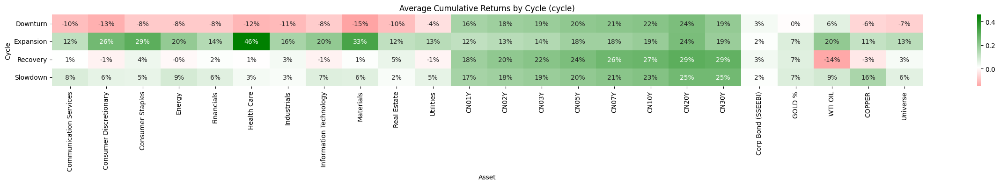

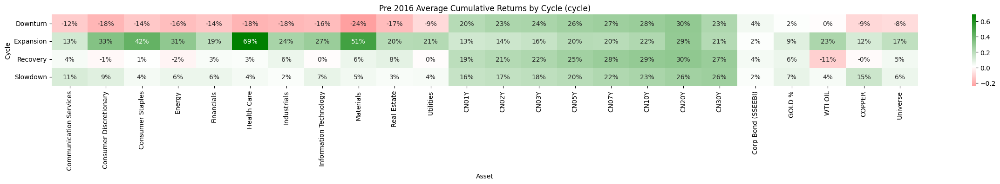

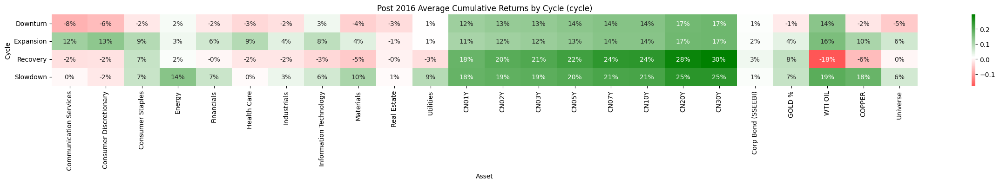

In [16]:
avg_return = cycle_summary.groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Average Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

avg_return = cycle_summary[cycle_summary['start_date'] < '2016-01-01'].groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Pre 2016 Average Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

avg_return = cycle_summary[cycle_summary['start_date'] > '2016-01-01'].groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Post 2016 Average Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

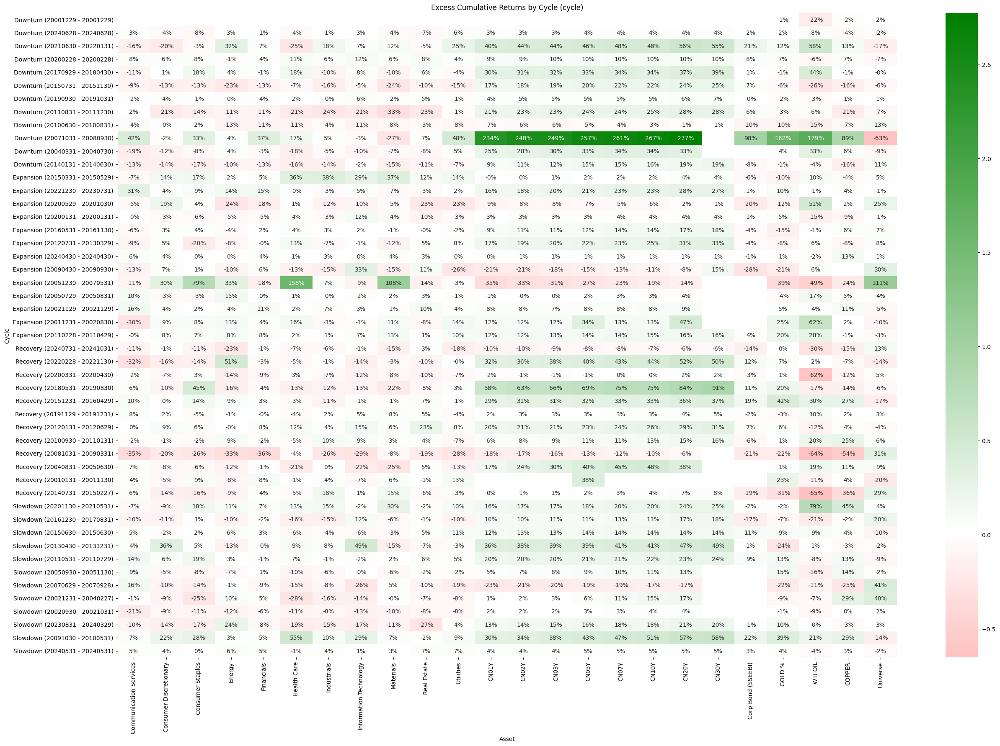

In [17]:
data = sector_df.join(universe_df).join(cycle_df)
data.rename(columns={'FWD_RET_1M':'Universe'}, inplace=True)
data.reset_index(inplace=True)

columns_to_cumprod = ['Communication Services', 'Consumer Discretionary',
       'Consumer Staples', 'Energy', 'Financials', 'Health Care',
       'Industrials', 'Information Technology', 'Materials', 'Real Estate',
       'Utilities', 'CN01Y', 'CN02Y', 'CN03Y', 'CN05Y', 'CN07Y',
       'CN10Y', 'CN20Y', 'CN30Y', 'Corp Bond (SSEEBI)', 'GOLD %', 'WTI OIL', 'COPPER', 'Universe']

for d in columns_to_cumprod[:-1]:
    data[d] = data[d] - data['Universe']

source = 'cycle'

# Compute start and end dates for each cycle
# Identify cycle changes by comparing with the previous row
data["cycle_change"] = data[source] != data[source].shift()
# Use `cumsum` to create a unique group for each continuous cycle segment
data["cycle_group"] = data["cycle_change"].cumsum()
cycle_dates = data.groupby([source, "cycle_group"]).agg(start_date=("date", "min"), end_date=("date", "max")).reset_index()

# Compute cumulative product for each column in each cycle and get the last value in each group
cumprod_results = data.groupby([source, "cycle_group"])[columns_to_cumprod].apply(lambda x: (1 + x).cumprod().iloc[-1] - 1).reset_index()

# Merge start and end dates with cumulative product results
cycle_summary = pd.merge(cycle_dates, cumprod_results, on=[source, "cycle_group"])

cycle_summary = cycle_summary.sort_values(source)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

heatmap_data = cycle_summary.copy()
heatmap_data["idx"] = cycle_summary[source] + " (" + cycle_summary["start_date"].dt.strftime("%Y%m%d") + " - " + cycle_summary["end_date"].dt.strftime("%Y%m%d") + ")"
heatmap_data = heatmap_data.set_index("idx").drop(columns=["start_date", "end_date", source, "cycle_group"])
# Plot the heatmap
colors = ["red", "white", "green"]
cmap = LinearSegmentedColormap.from_list("custom_red_yellow_green", colors)
plt.figure(figsize=(30, 20))
sns.heatmap(heatmap_data, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Excess Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

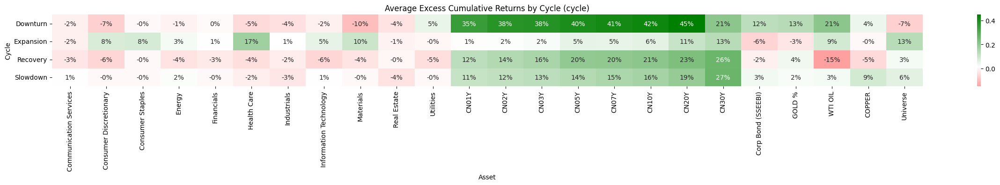

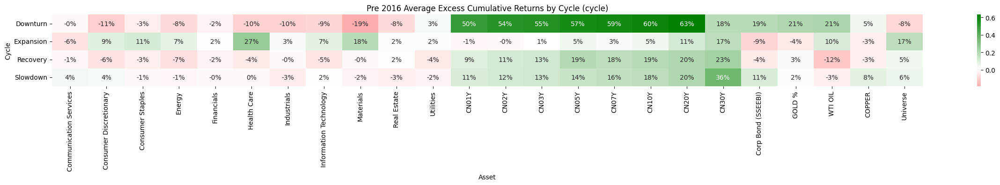

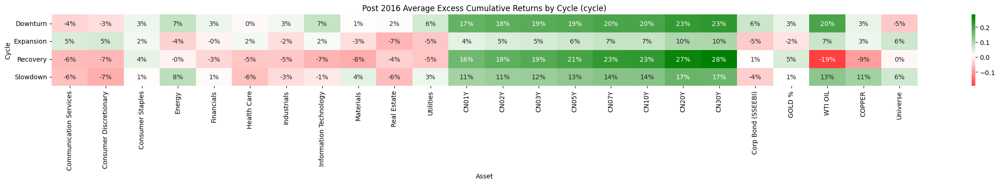

In [18]:
avg_return = cycle_summary.groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Average Excess Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

avg_return = cycle_summary[cycle_summary['start_date']<'2016-01-01'].groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Pre 2016 Average Excess Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

avg_return = cycle_summary[cycle_summary['start_date']>'2016-01-01'].groupby('cycle')[columns_to_cumprod].mean()

plt.figure(figsize=(30, 2))
sns.heatmap(avg_return, annot=True, cmap=cmap, fmt=".0%", center=0.01)
plt.title(f"Post 2016 Average Excess Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()